In [1]:
# By: Hui Yu (University at Buffalo), Raghav Ratnakar Potdar (University at Buffalo)
# Dataset: https://catalog.data.gov/dataset/motor-vehicle-collisions-crashes

In [2]:
import pandas as pd

In [3]:
df = pd.read_csv("final_data.csv")

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1748161 entries, 0 to 1748160
Data columns (total 32 columns):
 #   Column                         Dtype         
---  ------                         -----         
 0   CRASH DATE & TIME              datetime64[ns]
 1   BOROUGH                        object        
 2   ZIP CODE                       int64         
 3   LATITUDE                       float64       
 4   LONGITUDE                      float64       
 5   LOCATION                       object        
 6   NUMBER OF PERSONS INJURED      int64         
 7   NUMBER OF PERSONS KILLED       int64         
 8   NUMBER OF PEDESTRIANS INJURED  int64         
 9   NUMBER OF PEDESTRIANS KILLED   int64         
 10  NUMBER OF CYCLIST INJURED      int64         
 11  NUMBER OF CYCLIST KILLED       int64         
 12  NUMBER OF MOTORIST INJURED     int64         
 13  NUMBER OF MOTORIST KILLED      int64         
 14  CONTRIBUTING FACTOR VEHICLE 1  object        
 15  CONTRIBUTING FA

In [4]:
df["CRASH DATE & TIME"] = pd.to_datetime(df["CRASH DATE & TIME"])

In [5]:
# Electrive Vehicle df
ev = df[df["is_e_vehicle"]]
ev["VEHICLE TYPE CODE 1"].value_counts()

VEHICLE TYPE CODE 1
e-bike       10947
e-scooter     7584
Name: count, dtype: int64

In [6]:
# Motor Vehicle df
mv = df[~df["is_e_vehicle"]]
mv["VEHICLE TYPE CODE 1"].value_counts()

VEHICLE TYPE CODE 1
sedan                      752475
suv                        678429
truck                      105638
taxi                        84595
bus                         30791
van                         24899
bicycle                     17233
motorcycle                  13827
ambulance                    7420
emergency vehicle             728
construction vehicle          174
utility vehicle                44
law enforcement vehicle        18
e bik                           8
Name: count, dtype: int64

In [7]:
# Plotting Libraries
import folium
from folium.plugins import HeatMap
from collections import Counter
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

/Users/huiyu/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:34: NotOpenSSLWarning: urllib3 v2.0 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


# Graph 1: MV Accident Heatmap

In [8]:
# Filter out entries with null latitude and longitude
latitudes = list(mv[pd.notna(mv["LATITUDE"])]["LATITUDE"])
longitudes = list(mv[pd.notna(mv["LONGITUDE"])]["LONGITUDE"])

locations = list(zip(latitudes, longitudes))

# Count the amount of repeated locations
location_counts = Counter(locations)

heatmap_data = [(lat, lon, count) for (lat, lon), count in location_counts.items()]

# Create a Folium map centered around NYC
nyc_map = folium.Map(location=[40.7128, -74.0060], zoom_start=12)
HeatMap(heatmap_data).add_to(nyc_map)
nyc_map


# Graph 2: EV Accident Heatmap

In [9]:
# Filter out entries with null latitude and longitude
latitudes = list(ev[pd.notna(ev["LATITUDE"])]["LATITUDE"])
longitudes = list(ev[pd.notna(ev["LONGITUDE"])]["LONGITUDE"])

locations = list(zip(latitudes, longitudes))

# Count the number of repeated locations
location_counts = Counter(locations)

heatmap_data = [(lat, lon, count) for (lat, lon), count in location_counts.items()]

# Create a Folium map centered around NYC
nyc_map = folium.Map(location=[40.7128, -74.0060], zoom_start=12)
HeatMap(heatmap_data).add_to(nyc_map)
nyc_map


# Graph 3: MV Accident Scatter Plot

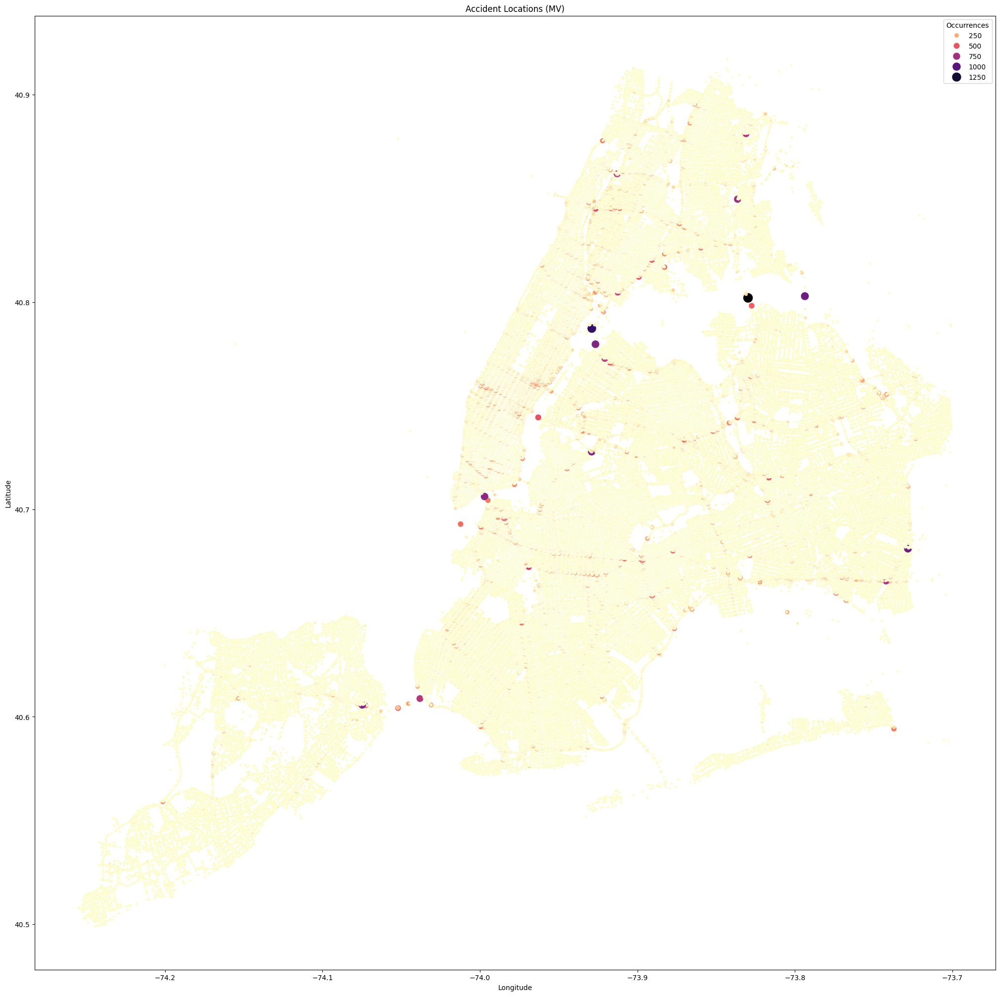

In [10]:
# Count occurrences of each (LATITUDE, LONGITUDE) pair
location_counts = mv.groupby(["LATITUDE", "LONGITUDE"]).size().reset_index(name="COUNT")

# Create scatterplot based on repeating locations
plt.figure(figsize=(25,25))
sns.scatterplot(x=location_counts["LONGITUDE"], 
                y=location_counts["LATITUDE"], 
                hue=location_counts["COUNT"], 
                palette="magma_r", 
                size=location_counts["COUNT"], 
                sizes=(10, 200))

# Labeling
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Accident Locations (MV)")
plt.legend(title="Occurrences")

plt.show()

# Graph 4: EV Accident Scatter Plot

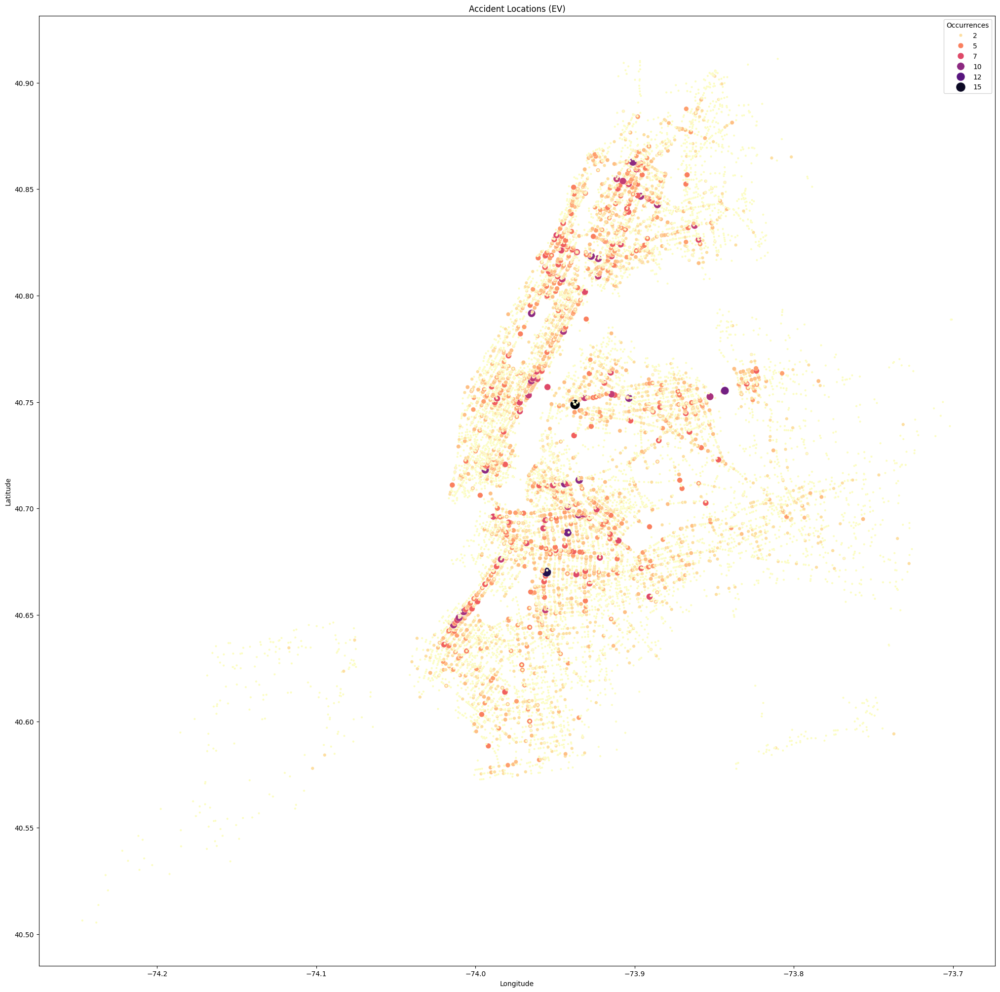

In [11]:
# Count occurrences of each (LATITUDE, LONGITUDE) pair
location_counts = ev.groupby(["LATITUDE", "LONGITUDE"]).size().reset_index(name="COUNT")

# Create scatterplot based on repeating locations
plt.figure(figsize=(25,25))
sns.scatterplot(x=location_counts["LONGITUDE"], 
                y=location_counts["LATITUDE"], 
                hue=location_counts["COUNT"], 
                palette="magma_r", 
                size=location_counts["COUNT"], sizes=(10, 200))

# Labeling
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Accident Locations (EV)")
plt.legend(title="Occurrences")

plt.show()

# Graph 5: All Fatality Locations

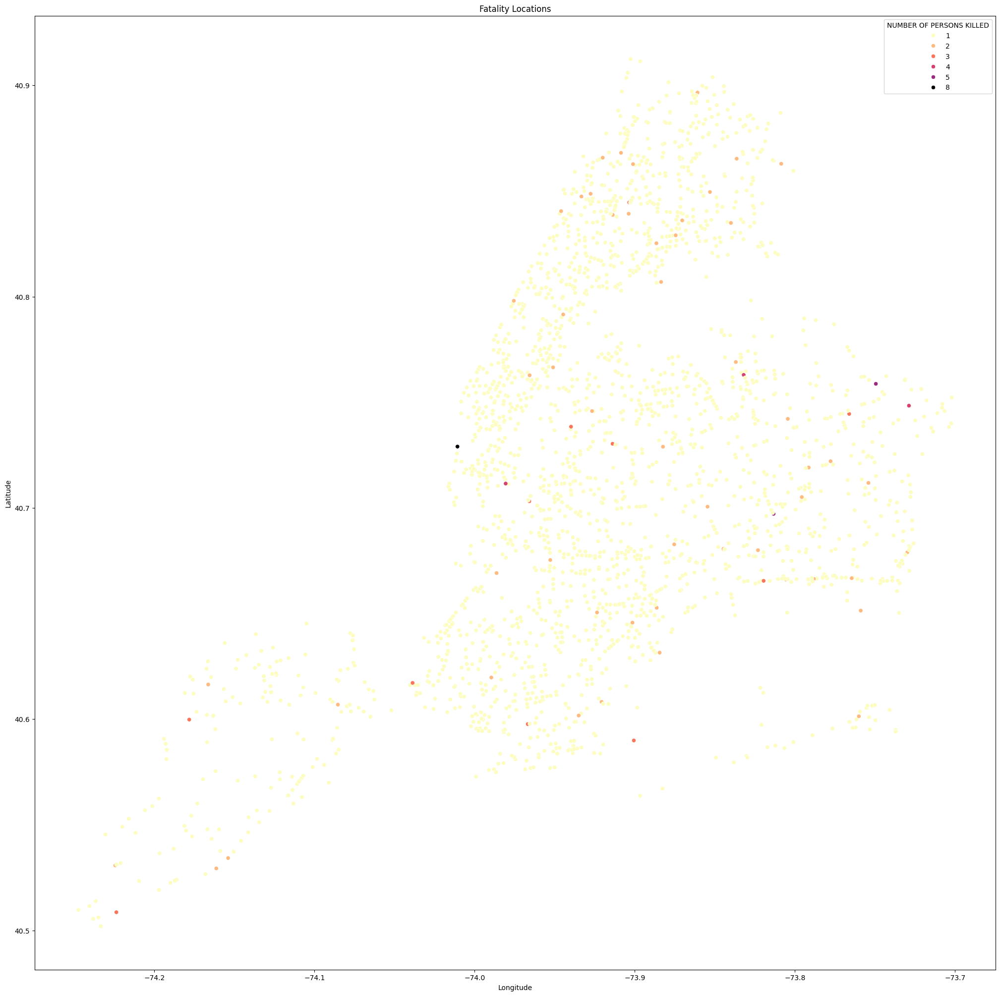

In [12]:
# Filter out entries with zero values
df_killed = df[df["NUMBER OF PERSONS KILLED"] > 0]
plt.figure(figsize=(25,25))
sns.scatterplot(x=df_killed["LONGITUDE"], y=df_killed["LATITUDE"], hue=df_killed["NUMBER OF PERSONS KILLED"], palette="magma_r")

# Labeling
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Fatality Locations")

plt.show()


# Graph 6: MV Injury Locations

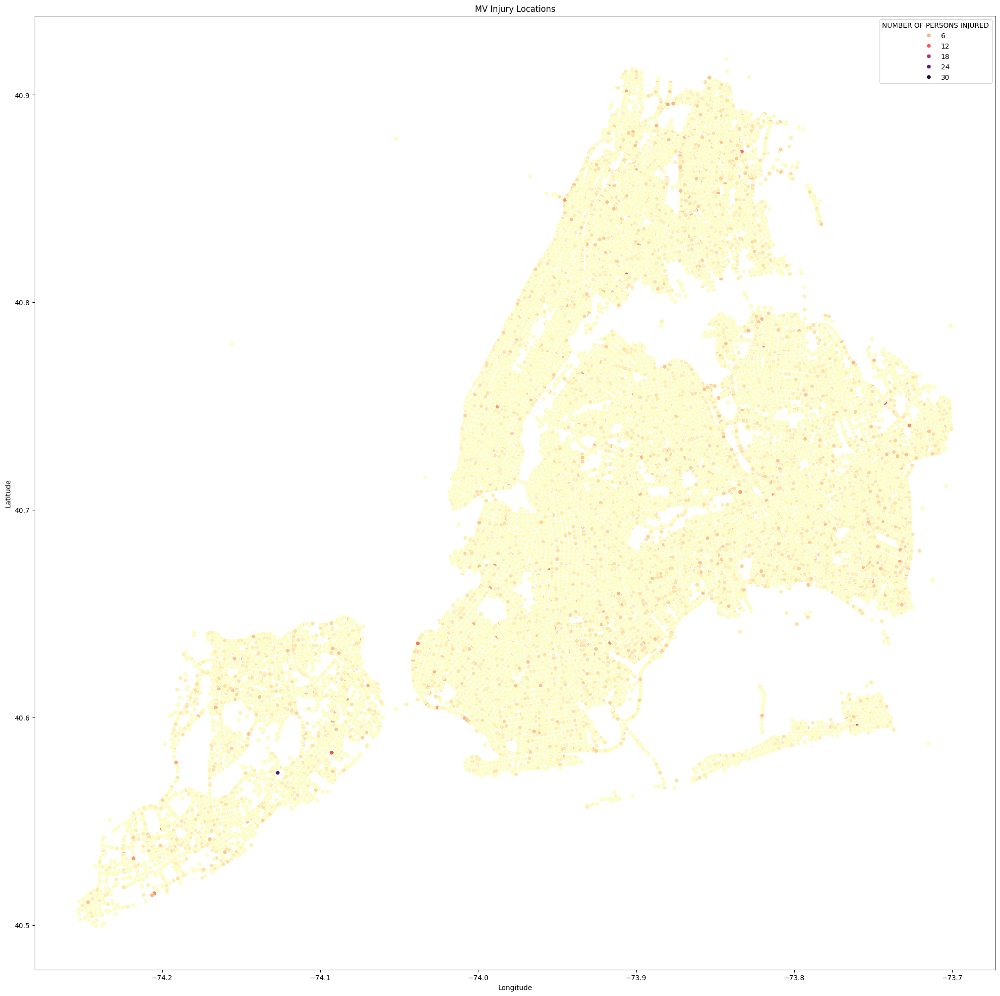

Percent of accident result in injuries: 23.958187589253193


In [13]:
# Filter out entries with zero values
df_injured = mv[mv["NUMBER OF PERSONS INJURED"] > 0]
plt.figure(figsize=(25,25))
sns.scatterplot(x=df_injured["LONGITUDE"], y=df_injured["LATITUDE"], hue=df_injured["NUMBER OF PERSONS INJURED"], palette="magma_r")

# Labeling
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("MV Injury Locations")

plt.show()
percent_injured = mv[mv["NUMBER OF PERSONS INJURED"] > 0]["NUMBER OF PERSONS INJURED"].count()/mv["NUMBER OF PERSONS INJURED"].count()*100
print("Percent of accident result in injuries: "+str(percent_injured))

# Graph 7: EV Injury Locations

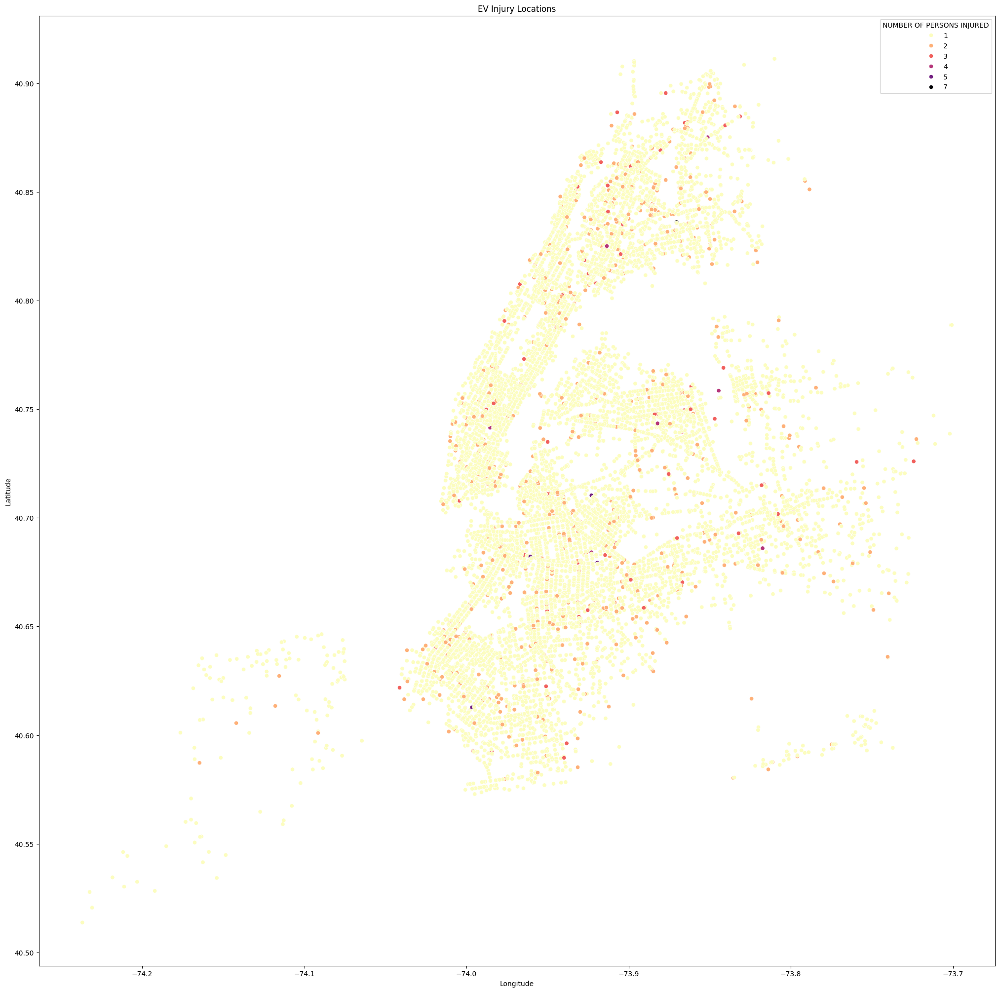

Percent of accident result in injuries: 78.43073768280179


In [14]:
# Filter out entries with zero values
df_injured = ev[ev["NUMBER OF PERSONS INJURED"] > 0]
plt.figure(figsize=(25,25))
sns.scatterplot(x=df_injured["LONGITUDE"], y=df_injured["LATITUDE"], hue=df_injured["NUMBER OF PERSONS INJURED"], palette="magma_r")

# Labeling
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("EV Injury Locations")

plt.show()
percent_injured = ev[ev["NUMBER OF PERSONS INJURED"] > 0]["NUMBER OF PERSONS INJURED"].count()/ev["NUMBER OF PERSONS INJURED"].count()*100
print("Percent of accident result in injuries: "+str(percent_injured))

In [15]:
# Filter out entries with undefined borough
mv_borough = mv[pd.notna(df["BOROUGH"])]
mv_borough.shape

/var/folders/9n/b1lb14dd11v9kphcqy_pd2_h0000gn/T/ipykernel_13107/4123805258.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  mv_borough = mv[pd.notna(df["BOROUGH"])]


(1728895, 30)

In [16]:
# Filter out entries with undefined borough
ev_borough = ev[pd.notna(ev["BOROUGH"])]
ev_borough.shape

(18525, 30)

In [17]:
mv_injuries = mv_borough.groupby("BOROUGH")["NUMBER OF PERSONS INJURED"].sum().reset_index()
mv_injuries_dict = mv_injuries.set_index("BOROUGH")["NUMBER OF PERSONS INJURED"].to_dict()
print("MV injuries per borough: ", mv_injuries_dict)

MV injuries per borough:  {'bronx': 97511, 'brooklyn': 185356, 'manhattan': 85458, 'queens': 165512, 'staten island': 28827}


In [18]:
mv_killed = mv_borough.groupby("BOROUGH")["NUMBER OF PERSONS KILLED"].sum().reset_index()
mv_killed_dict = mv_killed.set_index("BOROUGH")["NUMBER OF PERSONS KILLED"].to_dict()
print("MV fatalities per borough: ", mv_killed_dict)

MV fatalities per borough:  {'bronx': 476, 'brooklyn': 747, 'manhattan': 423, 'queens': 789, 'staten island': 170}


# Graph 8: MV Injury vs Fatality

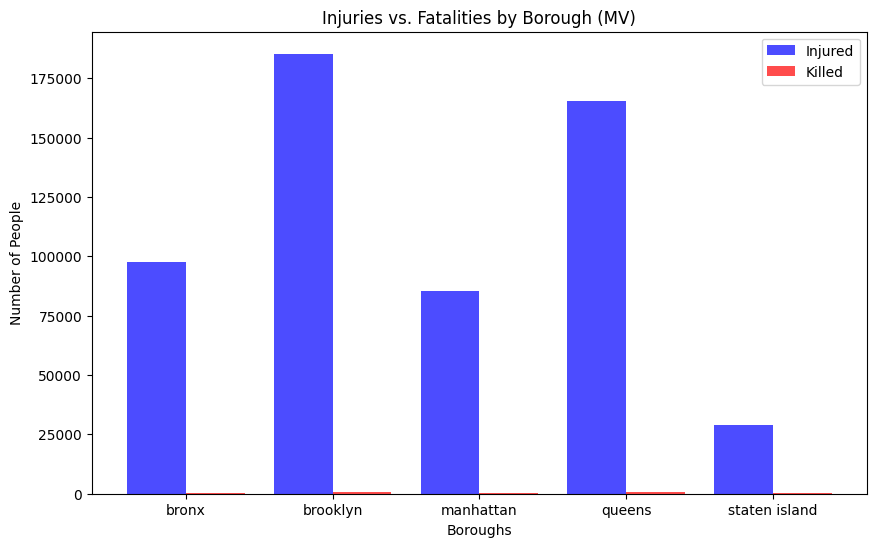

In [19]:
boroughs = list(mv_injuries_dict.keys())
injured_counts = list(mv_injuries_dict.values())
killed_counts = [mv_killed_dict.get(b, 0) for b in boroughs]  # Ensure all boroughs align

fig, ax = plt.subplots(figsize=(10, 6))

x = np.arange(len(boroughs))
width = 0.4

ax.bar(x - width/2, injured_counts, width, label="Injured", color="blue", alpha=0.7)
ax.bar(x + width/2, killed_counts, width, label="Killed", color="red", alpha=0.7)

# Labeling
ax.set_xlabel("Boroughs")
ax.set_ylabel("Number of People")
ax.set_title("Injuries vs. Fatalities by Borough (MV)")
ax.set_xticks(x)
ax.set_xticklabels(boroughs)
ax.legend()

plt.show()


# Graph 9: MV Fatality%

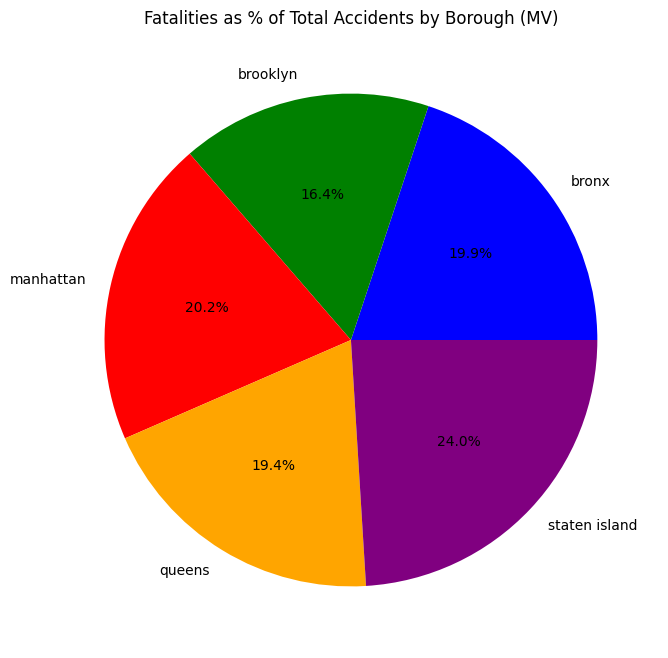

In [20]:
# Calculate fatality percentage
total_cases = {b: mv_injuries_dict[b] + mv_killed_dict.get(b, 0) for b in boroughs}
fatality_ratio = {b: mv_killed_dict.get(b, 0) / total_cases[b] * 100 for b in boroughs}

# Labling
plt.figure(figsize=(8, 8))
plt.pie(fatality_ratio.values(), labels=fatality_ratio.keys(), autopct="%1.1f%%", colors=["blue", "green", "red", "orange", "purple"])
plt.title("Fatalities as % of Total Accidents by Borough (MV)")

plt.show()


In [21]:
# Filter out entries with undefined borough
ev_borough = ev[pd.notna(ev["BOROUGH"])]
ev_borough.shape

(18525, 30)

In [22]:
ev_injuries = ev_borough.groupby("BOROUGH")["NUMBER OF PERSONS INJURED"].sum().reset_index()
ev_injuries_dict = ev_injuries.set_index("BOROUGH")["NUMBER OF PERSONS INJURED"].to_dict()
print("EV injuries per borough: ", ev_injuries_dict)

EV injuries per borough:  {'bronx': 2660, 'brooklyn': 6187, 'manhattan': 3289, 'queens': 3376, 'staten island': 140}


In [23]:
ev_killed = ev_borough.groupby("BOROUGH")["NUMBER OF PERSONS KILLED"].sum().reset_index()
ev_killed_dict = ev_killed.set_index("BOROUGH")["NUMBER OF PERSONS KILLED"].to_dict()
print("MV fatalities per borough: ", ev_killed_dict)

MV fatalities per borough:  {'bronx': 23, 'brooklyn': 38, 'manhattan': 28, 'queens': 24, 'staten island': 1}


# Graph 10: EV Injury vs Fatality

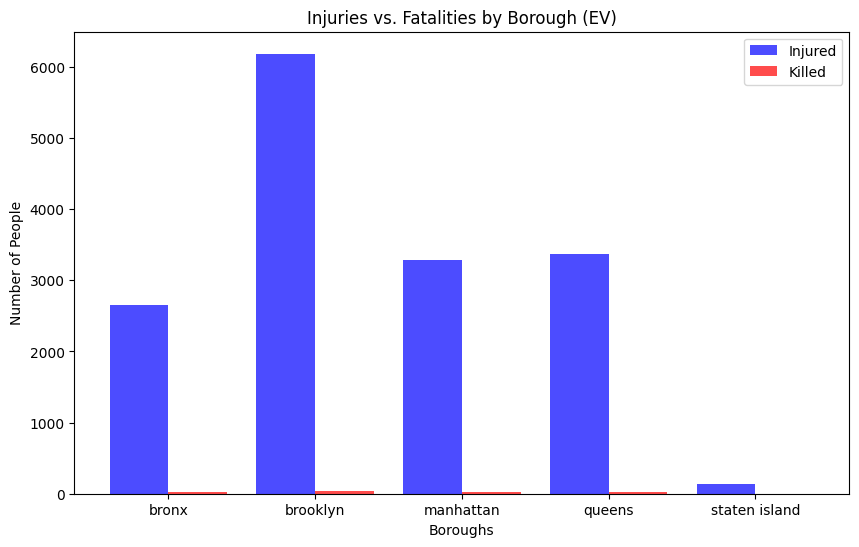

In [24]:
boroughs = list(ev_killed_dict.keys())
injured_counts = list(ev_injuries_dict.values())
killed_counts = [ev_killed_dict.get(b, 0) for b in boroughs]  # Ensure all boroughs align

fig, ax = plt.subplots(figsize=(10, 6))

x = np.arange(len(boroughs))
width = 0.4

ax.bar(x - width/2, injured_counts, width, label="Injured", color="blue", alpha=0.7)
ax.bar(x + width/2, killed_counts, width, label="Killed", color="red", alpha=0.7)

# Labeling
ax.set_xlabel("Boroughs")
ax.set_ylabel("Number of People")
ax.set_title("Injuries vs. Fatalities by Borough (EV)")
ax.set_xticks(x)
ax.set_xticklabels(boroughs)
ax.legend()

plt.show()

# Graph 11: EV Fatality%

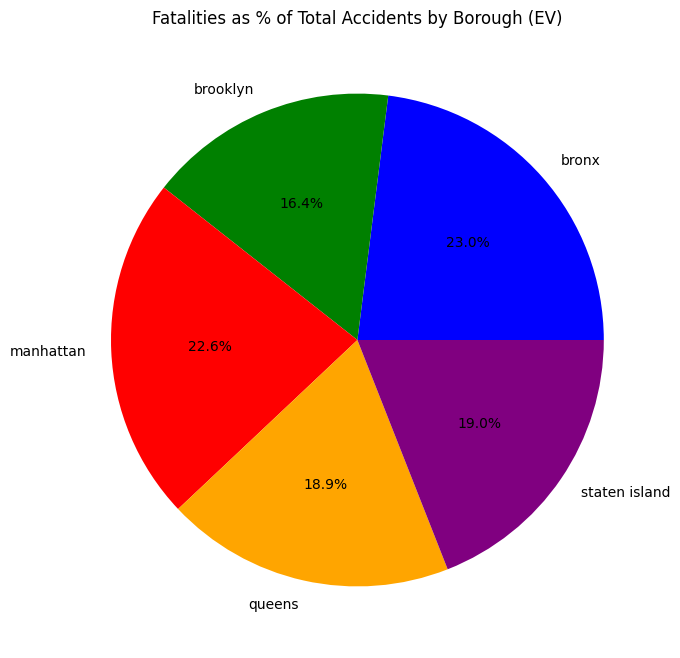

In [25]:
# Calculate fatality percentage
total_cases = {b: ev_injuries_dict[b] + ev_killed_dict.get(b, 0) for b in boroughs}
fatality_ratio = {b: ev_killed_dict.get(b, 0) / total_cases[b] * 100 for b in boroughs}

# Labling
plt.figure(figsize=(8, 8))
plt.pie(fatality_ratio.values(), labels=fatality_ratio.keys(), autopct="%1.1f%%", colors=["blue", "green", "red", "orange", "purple"])
plt.title("Fatalities as % of Total Accidents by Borough (EV)")

plt.show()

# Graph 12: EV vs MV Injuries by Borough

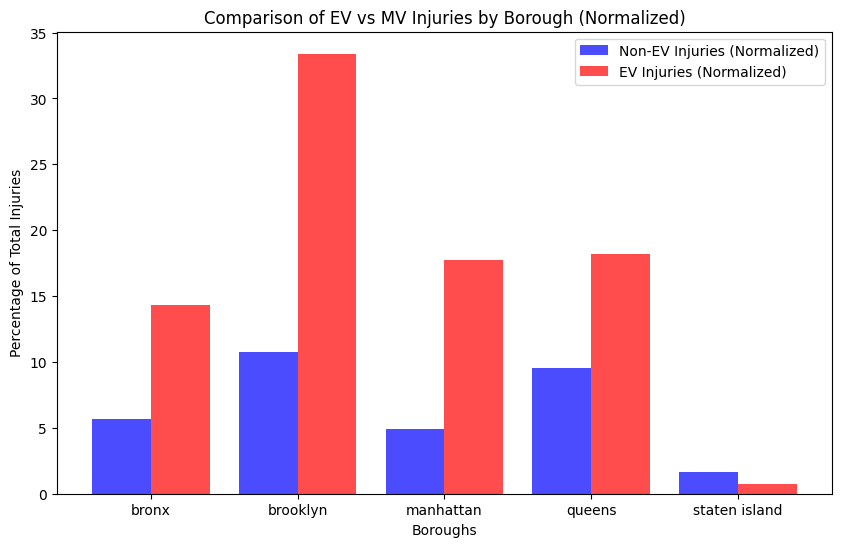

In [26]:
# Total entries for each category
total_mv = mv_borough.shape[0]
total_ev = ev_borough.shape[0]

boroughs = list(ev_injuries_dict.keys())
ev_values = list(ev_injuries_dict.values())
mv_values = list(mv_injuries_dict.values())

# Normalize the values (percentage of total injuries)
normalized_mv_values = [value / total_mv * 100 for value in mv_values]
normalized_ev_values = [value / total_ev * 100 for value in ev_values]

# Labeling
fig, ax = plt.subplots(figsize=(10, 6))
x = np.arange(len(boroughs)) 
width = 0.4

# Normalization
ax.bar(x - width/2, normalized_mv_values, width, label="Non-EV Injuries (Normalized)", color="blue", alpha=0.7)
ax.bar(x + width/2, normalized_ev_values, width, label="EV Injuries (Normalized)", color="red", alpha=0.7)

ax.set_xlabel("Boroughs")
ax.set_ylabel("Percentage of Total Injuries")
ax.set_title("Comparison of EV vs MV Injuries by Borough (Normalized)")
ax.set_xticks(x)
ax.set_xticklabels(boroughs)
ax.legend()

plt.show()


In [27]:
mv_zip = mv[mv["ZIP CODE"] != 0]
mv_zbj = mv_zip.groupby(["ZIP CODE", "BOROUGH"])["NUMBER OF PERSONS INJURED"].sum().reset_index()

# Graph 13: MV Injury Locations by ZIP Code

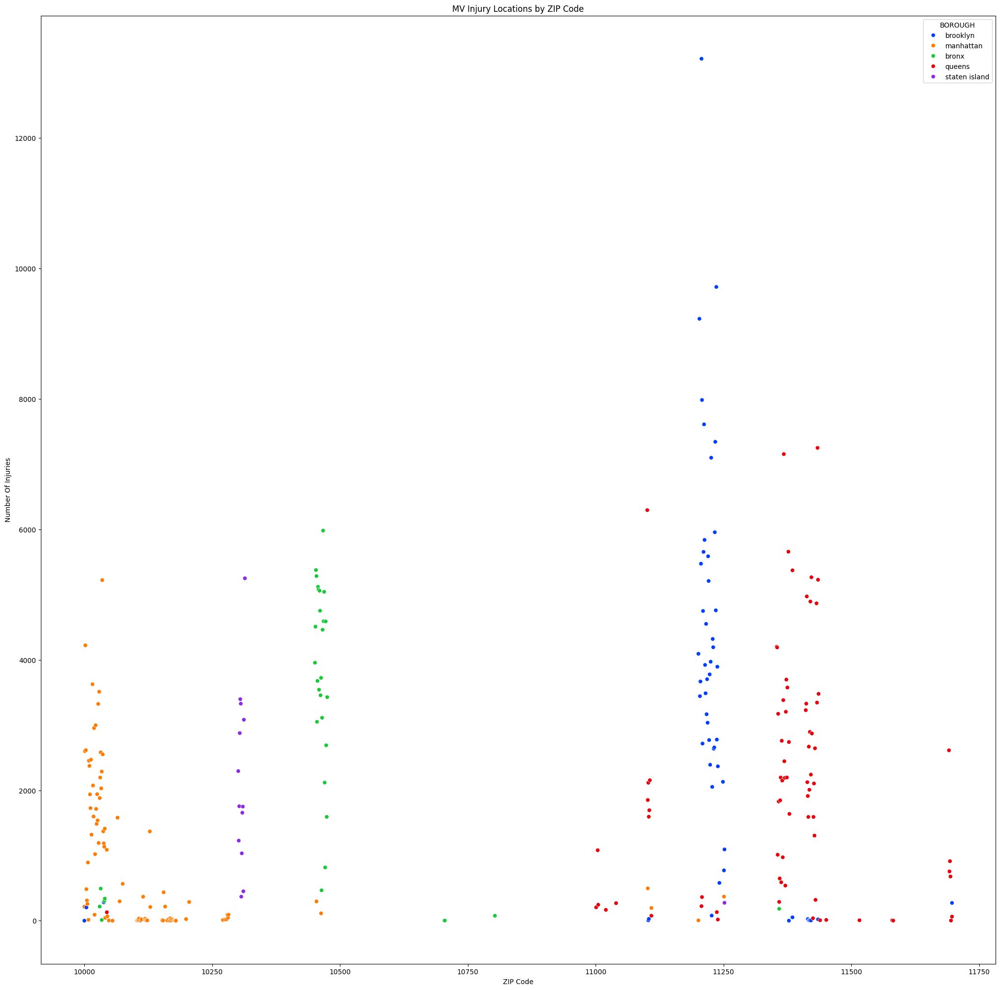

ZIP Code with the most amount of injuries: 11207


In [28]:
df_injured = mv_zbj[mv_zbj["NUMBER OF PERSONS INJURED"] > 0]
plt.figure(figsize=(25,25))
sns.scatterplot(x=df_injured["ZIP CODE"], y=df_injured["NUMBER OF PERSONS INJURED"], hue=df_injured["BOROUGH"], palette="bright")

# Labeling
plt.xlabel("ZIP Code")
plt.ylabel("Number Of Injuries")
plt.title("MV Injury Locations by ZIP Code")

plt.show()
max_zip = mv_zbj.loc[mv_zbj["NUMBER OF PERSONS INJURED"].idxmax(), "ZIP CODE"]
print("ZIP Code with the most amount of injuries: "+str(max_zip))

In [29]:
ev_zip = ev[ev["ZIP CODE"] != 0]
ev_zbj = ev_zip.groupby(["ZIP CODE", "BOROUGH"])["NUMBER OF PERSONS INJURED"].sum().reset_index()

# Graph 14: EV Injury Locations by ZIP Code

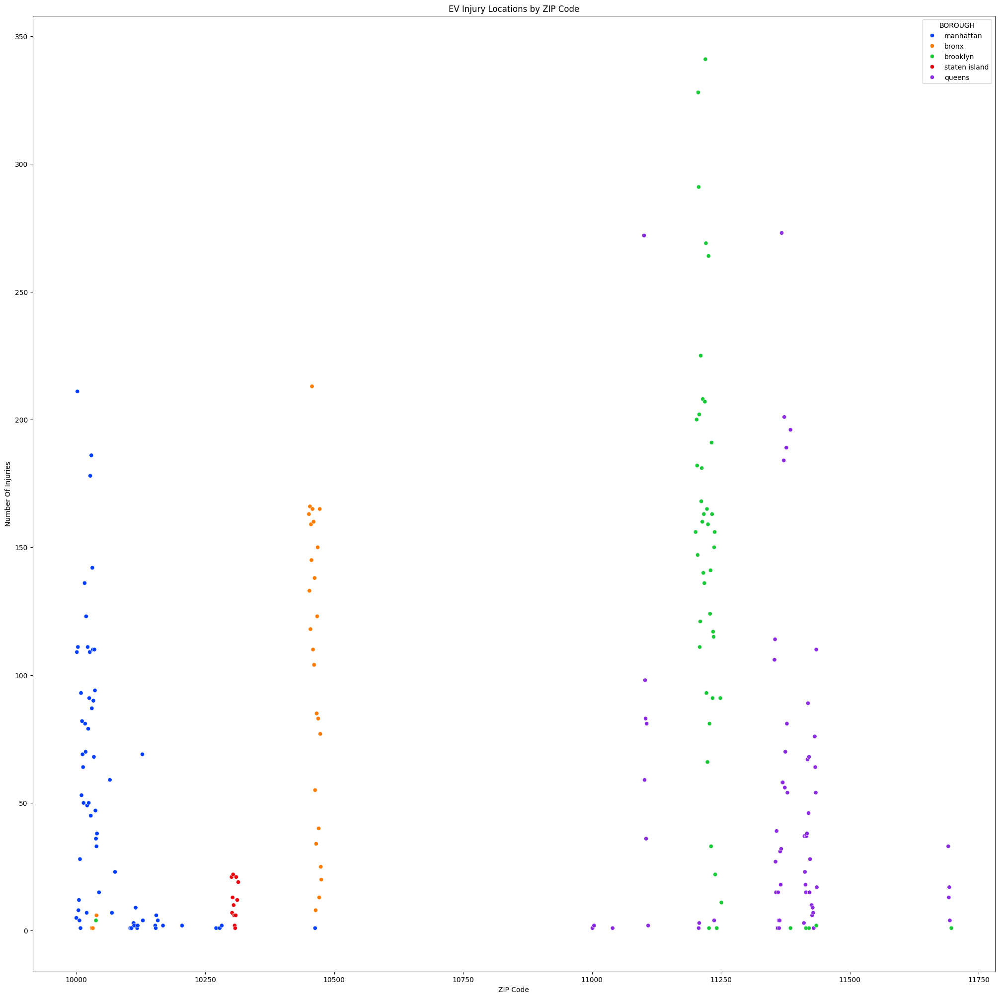

ZIP Code with the most amount of injuries: 11220


In [30]:
df_injured = ev_zbj[ev_zbj["NUMBER OF PERSONS INJURED"] > 0]
plt.figure(figsize=(25,25))
sns.scatterplot(x=df_injured["ZIP CODE"], y=df_injured["NUMBER OF PERSONS INJURED"], hue=df_injured["BOROUGH"], palette="bright")

# Labeling
plt.xlabel("ZIP Code")
plt.ylabel("Number Of Injuries")
plt.title("EV Injury Locations by ZIP Code")

plt.show()
max_zip = ev_zbj.loc[ev_zbj["NUMBER OF PERSONS INJURED"].idxmax(), "ZIP CODE"]
print("ZIP Code with the most amount of injuries: "+str(max_zip))

In [31]:
# Calculate all MV contributing factors
all_mv_factors = pd.Series(mv[[
    "CONTRIBUTING FACTOR VEHICLE 1", 
    "CONTRIBUTING FACTOR VEHICLE 2", 
    "CONTRIBUTING FACTOR VEHICLE 3", 
    "CONTRIBUTING FACTOR VEHICLE 4", 
    "CONTRIBUTING FACTOR VEHICLE 5"
]].values.flatten())

mv_factors = all_mv_factors[all_mv_factors != "unspecified"].value_counts()
mv_factors

driver inattention/distraction                           453812
following too closely                                    127867
failure to yield right-of-way                            121624
other vehicular                                           82484
backing unsafely                                          72136
passing or lane usage improper                            68788
passing too closely                                       58828
turning improperly                                        49036
unsafe lane changing                                      45888
traffic control disregarded                               38903
fatigued/drowsy                                           36163
unsafe speed                                              34428
driver inexperience                                       33674
reaction to uninvolved vehicle                            22987
alcohol involvement                                       21290
pavement slippery                       

In [32]:
# Calculate all EV contributing factors
all_ev_factors = pd.Series(ev[[
    "CONTRIBUTING FACTOR VEHICLE 1", 
    "CONTRIBUTING FACTOR VEHICLE 2", 
    "CONTRIBUTING FACTOR VEHICLE 3", 
    "CONTRIBUTING FACTOR VEHICLE 4", 
    "CONTRIBUTING FACTOR VEHICLE 5"
]].values.flatten())

ev_factors = all_ev_factors[all_ev_factors != "unspecified"].value_counts()
ev_factors

driver inattention/distraction                           5456
following too closely                                    1662
failure to yield right-of-way                            1339
passing or lane usage improper                            959
other vehicular                                           836
backing unsafely                                          781
passing too closely                                       773
unsafe lane changing                                      528
traffic control disregarded                               471
unsafe speed                                              465
turning improperly                                        413
driver inexperience                                       336
reaction to uninvolved vehicle                            315
alcohol involvement                                       281
view obstructed/limited                                   206
pavement slippery                                         197
pedestri

# Graph 15: MV Contributing Factors

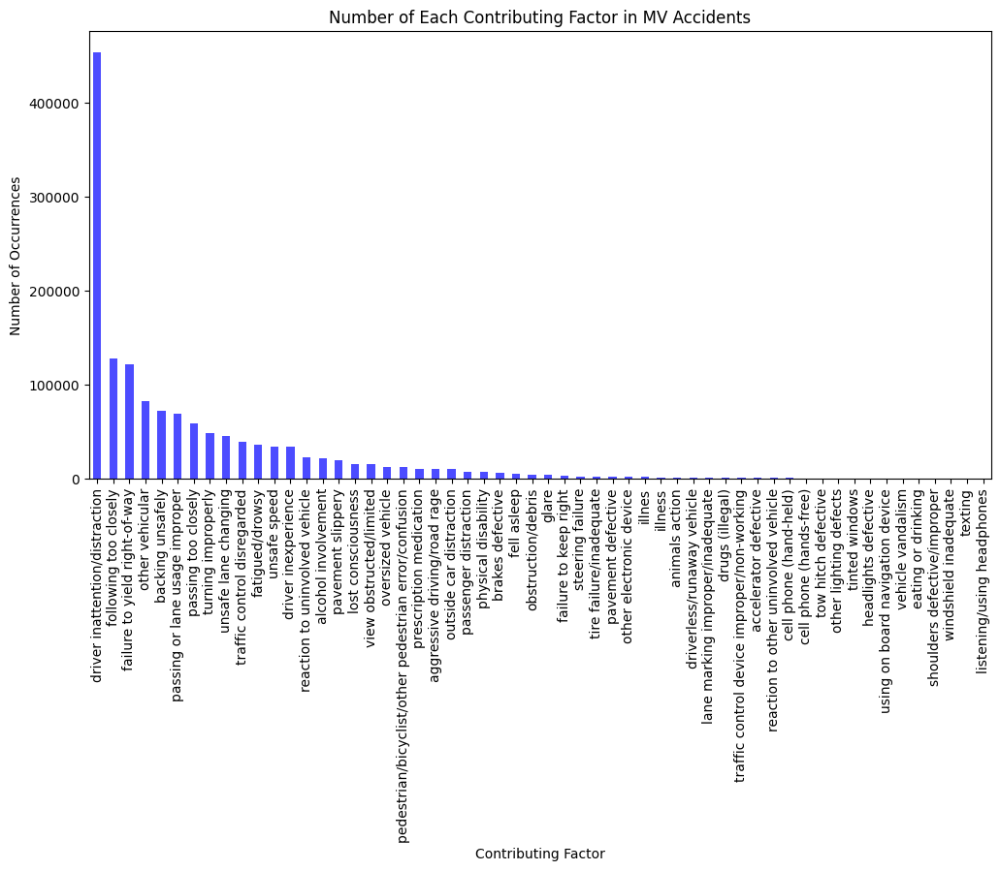

In [33]:
plt.figure(figsize=(12, 6))
mv_factors.plot(kind="bar", color="blue", alpha=0.7)

# Labeling
plt.xlabel("Contributing Factor")
plt.ylabel("Number of Occurrences")
plt.title("Number of Each Contributing Factor in MV Accidents")

plt.show()


# Graph 16: EV Contributing Factors

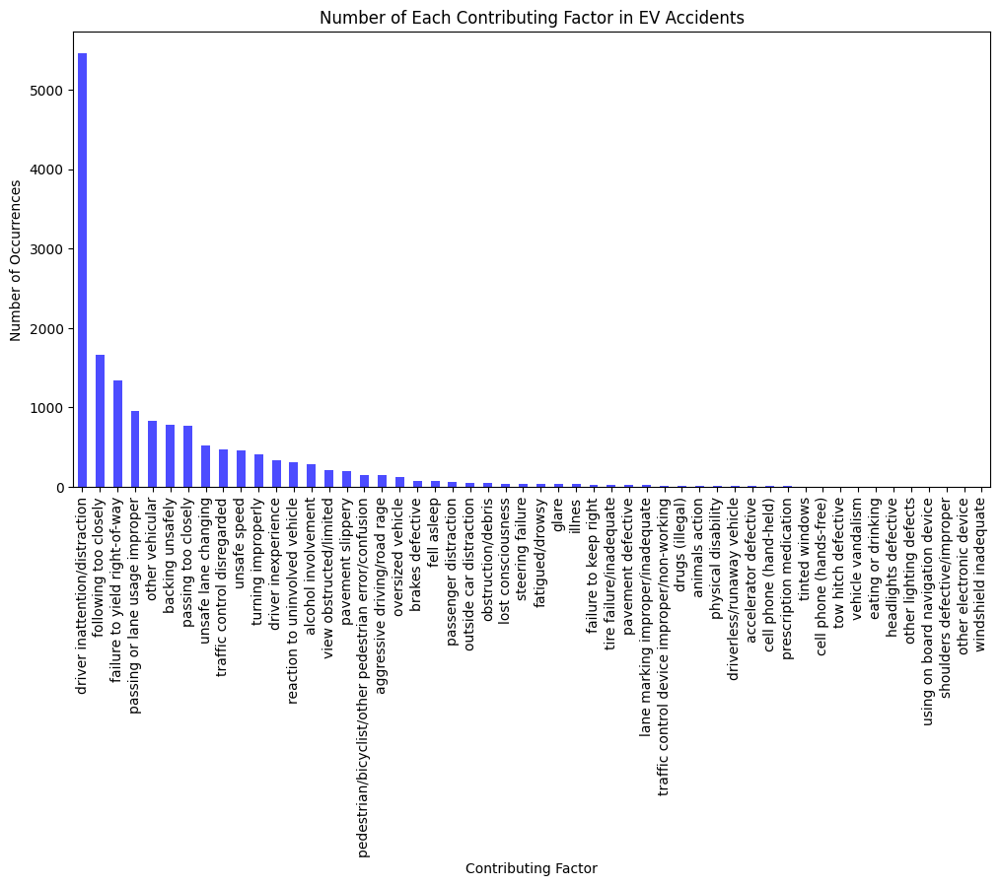

In [34]:
plt.figure(figsize=(12, 6))
ev_factors.plot(kind="bar", color="blue", alpha=0.7)

# Labeling
plt.xlabel("Contributing Factor")
plt.ylabel("Number of Occurrences")
plt.title("Number of Each Contributing Factor in EV Accidents")

plt.show()


# Graph 17: MV Top Contributing Factors

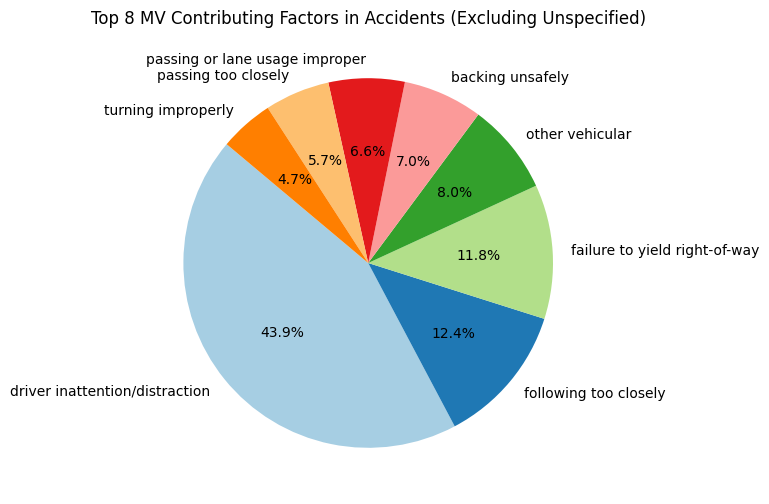

In [35]:
# Get the top 8 contributing factors after filtering
top_factors = mv_factors.nlargest(8)

plt.figure(figsize=(10, 6))
plt.pie(top_factors, labels=top_factors.index, autopct="%1.1f%%", startangle=140, colors=plt.cm.Paired.colors)

plt.title("Top 8 MV Contributing Factors in Accidents (Excluding Unspecified)")

plt.show()


# Graph 18: EV Top Contributing Factors

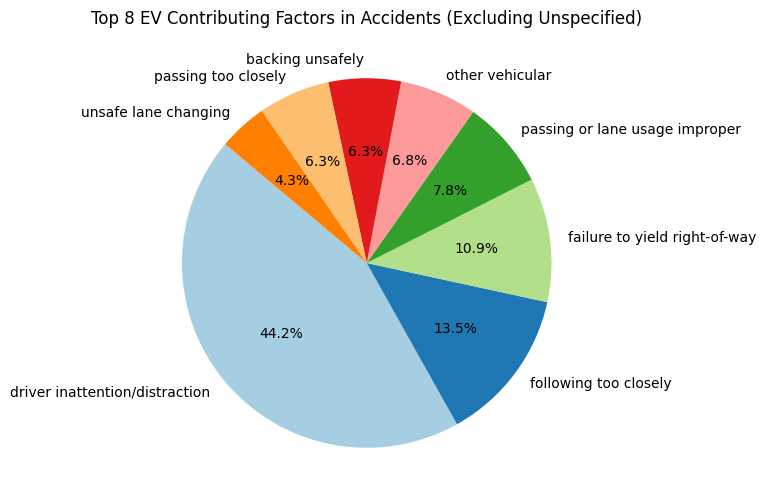

In [36]:
# Get the top 8 contributing factors after filtering
top_factors = ev_factors.nlargest(8)

plt.figure(figsize=(10, 6))
plt.pie(top_factors, labels=top_factors.index, autopct="%1.1f%%", startangle=140, colors=plt.cm.Paired.colors)

plt.title("Top 8 EV Contributing Factors in Accidents (Excluding Unspecified)")

plt.show()

# Graph 19: MV Crashes Per Year

/var/folders/9n/b1lb14dd11v9kphcqy_pd2_h0000gn/T/ipykernel_13107/4163151004.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=yearly_counts.index, y=yearly_counts.values, palette="Blues")


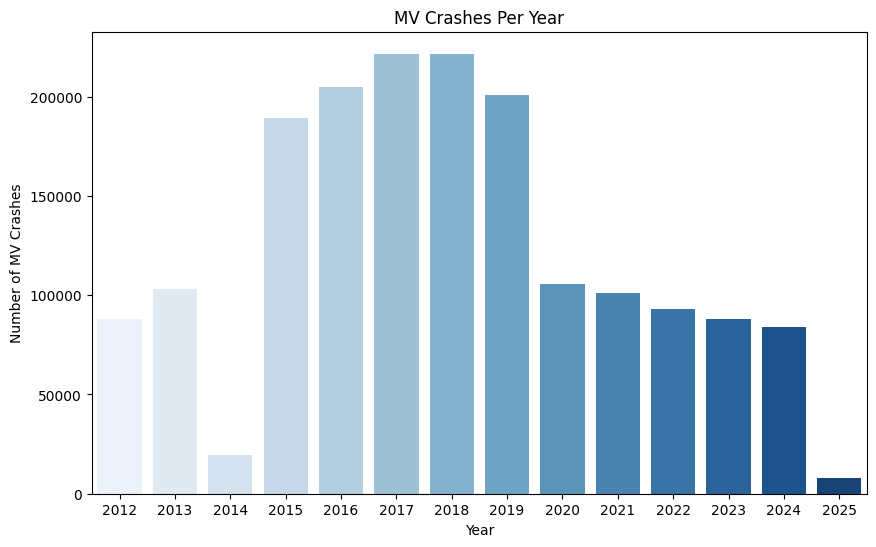

In [37]:
# Compute MV crash counts per year
yearly_counts = mv["CRASH DATE & TIME"].dt.year.value_counts().sort_index()

# Bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x=yearly_counts.index, y=yearly_counts.values, palette="Blues")

# Labeling
plt.xlabel("Year")
plt.ylabel("Number of MV Crashes")
plt.title("MV Crashes Per Year")

plt.show()


# Graph 20: EV Crashes Per Year

/var/folders/9n/b1lb14dd11v9kphcqy_pd2_h0000gn/T/ipykernel_13107/1976300821.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=yearly_counts.index, y=yearly_counts.values, palette="Blues")


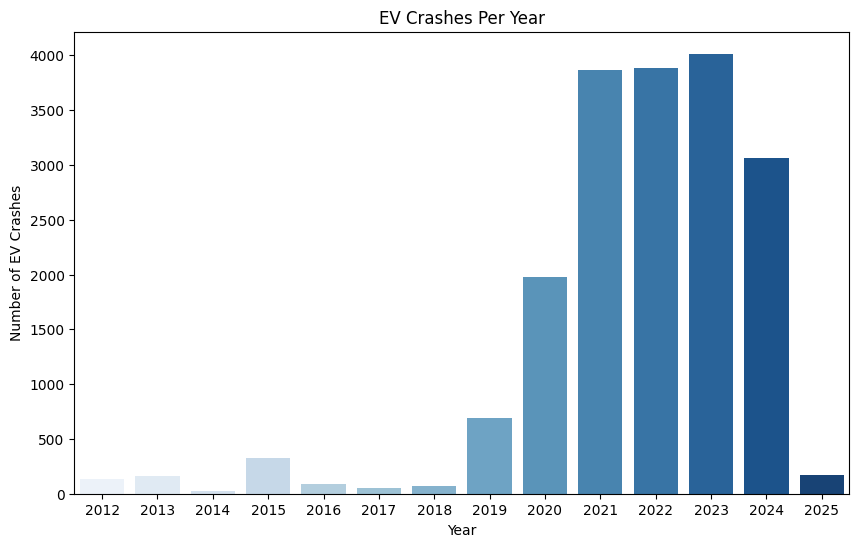

In [38]:
# Compute EV crash counts per year
yearly_counts = ev["CRASH DATE & TIME"].dt.year.value_counts().sort_index()

# Bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x=yearly_counts.index, y=yearly_counts.values, palette="Blues")

# Labeling
plt.xlabel("Year")
plt.ylabel("Number of EV Crashes")
plt.title("EV Crashes Per Year")

plt.show()


# 21. Identify relationships between time and crash occurrence

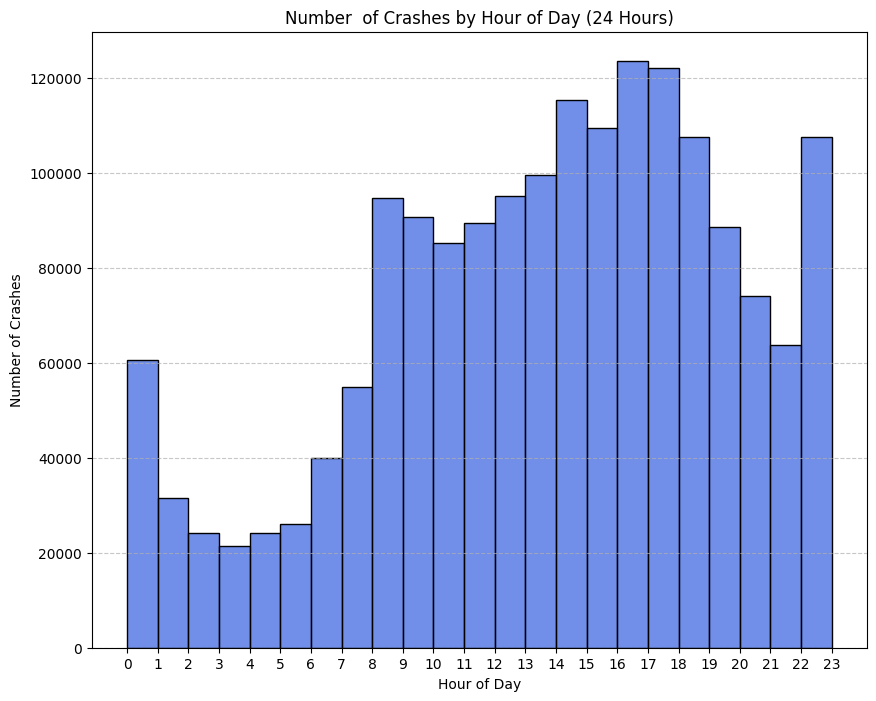

In [39]:
plt.figure(figsize=(10, 8))
sns.histplot(df['CRASH DATE & TIME'].dt.hour, bins=23, color='royalblue')

#Labeling
plt.xlabel('Hour of Day')
plt.ylabel('Number of Crashes')
plt.title('Number  of Crashes by Hour of Day (24 Hours)')
plt.xticks(range(0, 24))
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# 22. Identify relationships between time and crash occurrence (EV)

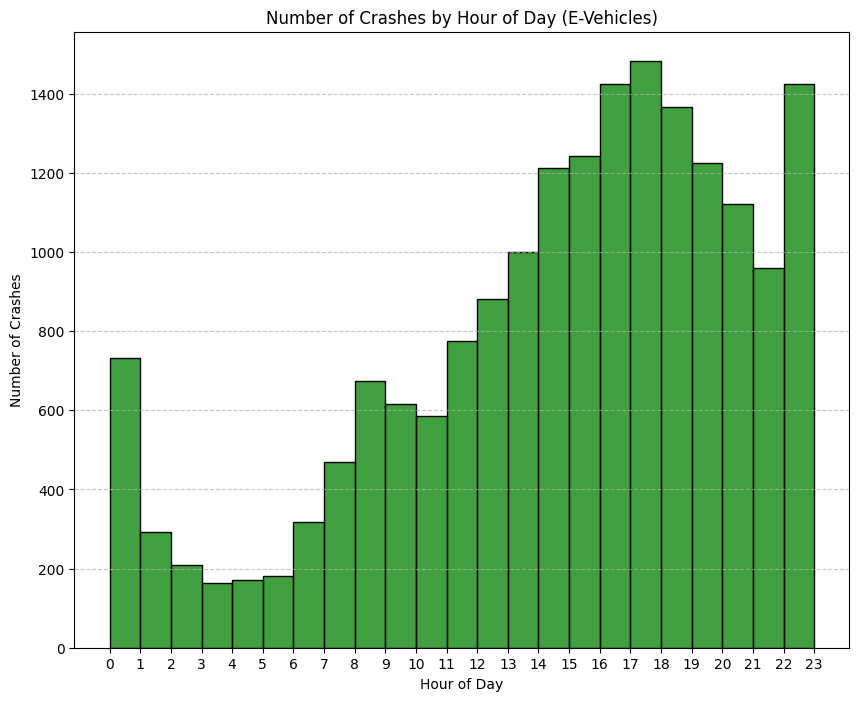

In [40]:
ev = df[df['is_e_vehicle'] == 1]

plt.figure(figsize=(10, 8))
sns.histplot(ev['CRASH DATE & TIME'].dt.hour, bins=23, color='green')

#Labeling
plt.xlabel('Hour of Day')
plt.ylabel('Number of Crashes')
plt.title('Number of Crashes by Hour of Day (E-Vehicles)')
plt.xticks(range(0, 24))
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Graph 23. Crashes by Day of Week and Time of Day (EV)

/var/folders/9n/b1lb14dd11v9kphcqy_pd2_h0000gn/T/ipykernel_13107/2076039211.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ev['DAY_OF_WEEK'] = ev['CRASH DATE & TIME'].dt.day_name()


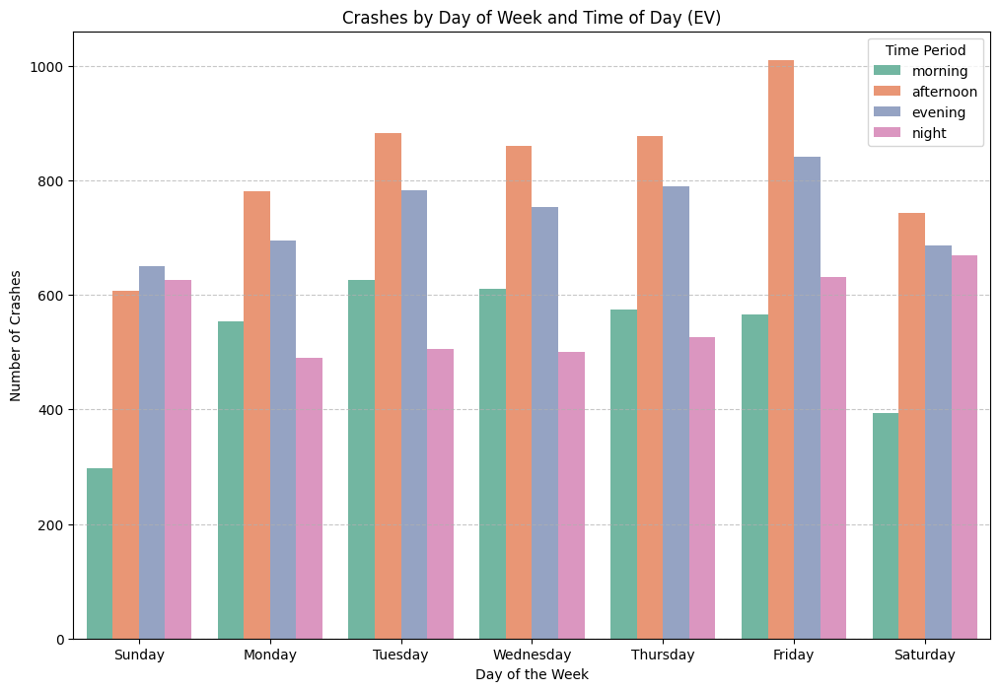

In [41]:
ev['DAY_OF_WEEK'] = ev['CRASH DATE & TIME'].dt.day_name()

days_order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"]
time_order = ["morning", "afternoon", "evening", "night"]

crash_counts = ev.groupby(['DAY_OF_WEEK', 'Time of Day']).size().reset_index(name='COUNT')

plt.figure(figsize=(12, 8))
sns.barplot(data=crash_counts, x="DAY_OF_WEEK", y="COUNT", hue="Time of Day", order=days_order, hue_order=time_order, palette="Set2")

# Labels and title
plt.xlabel("Day of the Week")
plt.ylabel("Number of Crashes")
plt.title("Crashes by Day of Week and Time of Day (EV)")
plt.legend(title="Time Period")
plt.grid(axis="y", linestyle="--", alpha=0.7)

plt.show()

In [42]:
# Define severity score based on injuries & fatalities
df['Severity Score'] = df['NUMBER OF PERSONS INJURED'] + (df['NUMBER OF PERSONS KILLED'] * 5)

# Create severity category
df['Severity Category'] = pd.cut(df['Severity Score'], bins=[0, 1, 2, 3, float('inf')],
                                 labels=['Minor', 'Moderate', 'Severe', 'Critical'])

# Graph 24. Crash Occurrence and Severity by Time of Day (All Crashes)

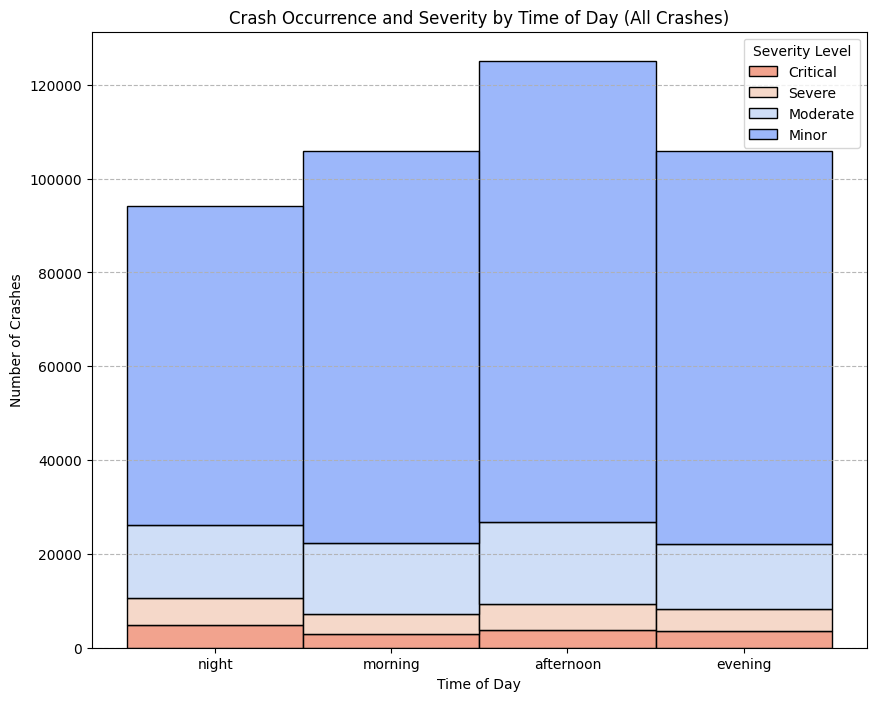

In [43]:
plt.figure(figsize=(10, 8))
sns.histplot(df, x='Time of Day', hue='Severity Category', multiple='stack', bins=4, palette='coolwarm')

#Labeling
plt.xlabel('Time of Day')
plt.ylabel('Number of Crashes')
plt.title('Crash Occurrence and Severity by Time of Day (All Crashes)')
plt.xticks(range(0, 4))
plt.grid(axis='y', linestyle='--', alpha=0.9)
plt.legend(title="Severity Level", labels = ['Critical', 'Severe', 'Moderate', 'Minor',])
plt.show()

# Graph 25. Severity of Incidents For Top 10 Vehicle Type

/var/folders/9n/b1lb14dd11v9kphcqy_pd2_h0000gn/T/ipykernel_13107/3084485917.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  severity_by_vehicle = df_top.groupby(['VEHICLE TYPE CODE 1', 'Severity Category']).size().unstack(fill_value=0)


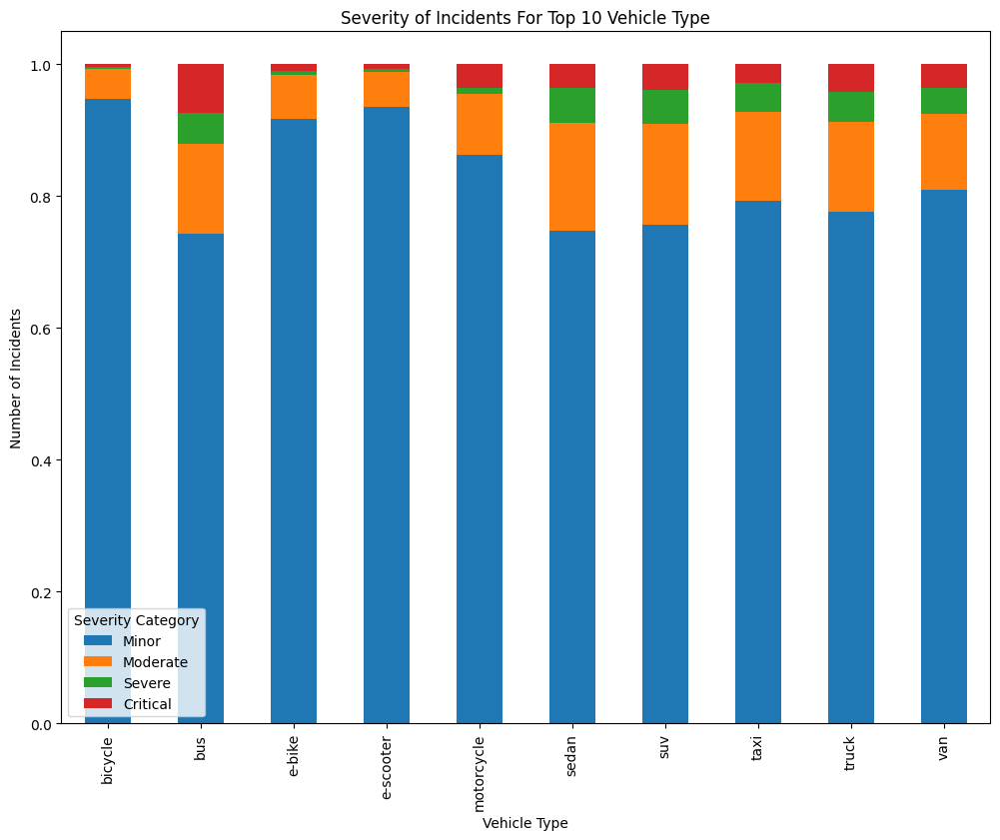

In [44]:
vehicle_types = df['VEHICLE TYPE CODE 1'].value_counts().nlargest(10).index

df_top = df[df['VEHICLE TYPE CODE 1'].isin(vehicle_types)]

severity_by_vehicle = df_top.groupby(['VEHICLE TYPE CODE 1', 'Severity Category']).size().unstack(fill_value=0)

severity_normalized = severity_by_vehicle.div(severity_by_vehicle.sum(axis=1), axis=0)

severity_normalized.plot(kind='bar', stacked=True, figsize=(12, 9))

#Labeling
plt.title('Severity of Incidents For Top 10 Vehicle Type')
plt.xlabel('Vehicle Type')
plt.ylabel('Number of Incidents')
plt.legend(title='Severity Category')
plt.show()